## Individual Project Airports


<p align="center"> <img src="https://wallpaperaccess.com/full/2248344.jpg"> </p>   

by [Oksana Palej](https://www.linkedin.com/in/oksana-palej-/)

# Aviation and its Data

## Introduction 

First of all we are going to do an analysis of a database on world aviation. We will use some of the most important attributes in Python such as Pandas, Matloplib, Seaborn, etc. to show plots of multiple aspects of different events with the goal of displaying an unreadable database and turning it into something much friendlier.


## Content of this notebook  

In the first part of this notebook, we will analyze aviation occurrence data provided in the document csv **airports.csv** from the web https://openflights.org/data.html. We will download the data, and after some cleaning and organizing, we will show plots of multiple aspects of these events.

#### We will investigate the following points from openflights.org:
With the dataset information, do the following:
1. Loading of the dataset as a dataframe.
2. Shows the first 10 rows of the dataframe.
3. Get a statistical summary.
4. For this analysis we are not going to use the 'AirportID', 'Latitude', 'Longitude' and 'Altitude' columns, remove them from the dataframe.
5. Get a statistical summary again, how has the data changed?
6. In the statistical summary above it seems that in column TZ there is a rare value \N, check the proportion of them with value_counts.
7. Reload the dataset so that null values are correctly interpreted (repeat section 4, delete columns).
8. Checks the entire dataframe for null values.
9. Overwrites the null values of the IATA and ICAO columns with the value 'UNKNOWN'
10. Changes the type of the DST and TZ variables to categorical.
11. Obtain a statistical summary of the categorical variables.
12. Groups the dataframe by airport type, showing the type count.
13. Select the name of the cities whose airport type is "port"
14. Shows all the rows of the fields name of the airport, name of the country and, name of the city, whose country is Spain.
15. Shows the name of the country and the airport belonging to the city of Madrid and Barcelona. Are all the records from Spain?
16. Save the previous results in a csv called Madrid_Barcelona.csv


In the second part of this notebook, we will investigate **Aviation occurrences in Canada** analyzing the aviation occurrence data provided by [Transport Canada](https://www.bst-tsb.gc.ca/eng/stats/aviation/data-5.html). We will download the data, and after some cleaning and organizing, we will show plots of multiple aspects of these events.

#### We will investigate the following points from Aviation occurences in Canada :
1. The airports of Canada
2. What is the number of events reported in each country?
3. When did the incidents happen?
4. Are there any periods of the year where more events take place?
5. Impact of environmental factors on aviation safety
6. Breakdown of aviation occurrences by sky conditions
7. Breakdown of aviation occurrences by weather condition
8. Impact of visibility on aviation safety
9. Impact of weather phenomena on flight safety
10. Number of fatal injuries reported each year
11. Number of serious injuries reported each year
12. Visualizing the total number of accidents
13. Visualization of airplane crashes

In [1]:
# importing python libraries
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import numpy as np
import geopandas as gpd
from shapely.geometry import Point, LineString
import matplotlib.pyplot as plt
from descartes import PolygonPatch

### *1. Loading of the dataset as a dataframe.*

In [2]:
import pandas as pd

In [3]:
df = pd.read_csv("airports-extended.csv", 
                 header=None, 
                 names=["AirportID","Name","City",
                        "Country","IATA","ICAO","Latitude","Longitude","Altitude",
                        "Timezone","DST","TZ","Type","source"])
df

,AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,TZ,Type,source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12663,14107,Ulan-Ude East Airport,Ulan Ude,Russia,\N,XIUW,51.849998,107.737999,1670,\N,\N,\N,airport,OurAirports
12664,14108,Krechevitsy Air Base,Novgorod,Russia,\N,ULLK,58.625000,31.385000,85,\N,\N,\N,airport,OurAirports
12665,14109,Desierto de Atacama Airport,Copiapo,Chile,CPO,SCAT,-27.261200,-70.779198,670,\N,\N,\N,airport,OurAirports
12666,14110,Melitopol Air Base,Melitopol,Ukraine,\N,UKDM,46.880001,35.305000,0,\N,\N,\N,airport,OurAirports


### *2. Lets show the first 10 rows of the dataframe.*

In [4]:
df.head(10)

,AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,TZ,Type,source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports
5,6,Wewak International Airport,Wewak,Papua New Guinea,WWK,AYWK,-3.583830,143.669006,19,10,U,Pacific/Port_Moresby,airport,OurAirports
6,7,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,BGBW,61.160500,-45.425999,112,-3,E,America/Godthab,airport,OurAirports
7,8,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,BGGH,64.190903,-51.678101,283,-3,E,America/Godthab,airport,OurAirports
8,9,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,BGSF,67.012222,-50.711603,165,-3,E,America/Godthab,airport,OurAirports
9,10,Thule Air Base,Thule,Greenland,THU,BGTL,76.531197,-68.703201,251,-4,E,America/Thule,airport,OurAirports


### *3. We are going to get a **statistical summary** that can help us to understand the dataset and identify potential issues or areas for further investigation.*

In [5]:
df.describe()


,AirportID,Latitude,Longitude,Altitude
count,12668.000000,12668.000000,12668.000000,12668.000000
mean,7311.584465,29.820510,-1.041145,831.871093
std,4202.520098,26.923942,83.618663,1498.239733
min,1.000000,-90.000000,-179.876999,-1266.000000
25%,3349.750000,16.115875,-77.294770,38.000000
50%,7771.500000,38.341850,6.955411,232.500000
75%,10943.250000,49.306042,47.835824,883.500000
max,14111.000000,90.000000,179.951004,14472.000000


In [6]:
df.info() # It is interesting to note that the statistical summary automatically discards any variable that is not numerical.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12668 entries, 0 to 12667
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   AirportID  12668 non-null  int64  
 1   Name       12668 non-null  object 
 2   City       12619 non-null  object 
 3   Country    12668 non-null  object 
 4   IATA       12668 non-null  object 
 5   ICAO       12667 non-null  object 
 6   Latitude   12668 non-null  float64
 7   Longitude  12668 non-null  float64
 8   Altitude   12668 non-null  int64  
 9   Timezone   12668 non-null  object 
 10  DST        12668 non-null  object 
 11  TZ         12668 non-null  object 
 12  Type       12668 non-null  object 
 13  source     12668 non-null  object 
dtypes: float64(2), int64(2), object(10)
memory usage: 1.4+ MB


With the function **df.describe()** we are getting a statistical summary of only the columns in the DataFrame that contain object or string data types.
The appearance of "\N" in a dataset or text data generally indicates that a null or missing value is present in the data.

In [7]:
df.describe()

,AirportID,Latitude,Longitude,Altitude
count,12668.000000,12668.000000,12668.000000,12668.000000
mean,7311.584465,29.820510,-1.041145,831.871093
std,4202.520098,26.923942,83.618663,1498.239733
min,1.000000,-90.000000,-179.876999,-1266.000000
25%,3349.750000,16.115875,-77.294770,38.000000
50%,7771.500000,38.341850,6.955411,232.500000
75%,10943.250000,49.306042,47.835824,883.500000
max,14111.000000,90.000000,179.951004,14472.000000


The function **df.describe(include="all")** provides a summary of statistics for all columns in the DataFrame, including both numeric and non-numeric columns.

This information can help us gain a more complete understanding of the customer data.

In [8]:
df.describe(include="all")

,AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,TZ,Type,source
count,12668.000000,12668,12619,12668,12668,12667,12668.000000,12668.000000,12668.000000,12668,12668,12668,12668,12668
unique,NaN,12330,9673,241,6925,8161,NaN,NaN,NaN,42,8,312,5,4
top,NaN,North Sea,New York,United States,\N,\N,NaN,NaN,NaN,1,E,\N,airport,OurAirports
freq,NaN,21,50,2708,5744,4507,NaN,NaN,NaN,2706,3478,4282,8264,7698
mean,7311.584465,NaN,NaN,NaN,NaN,NaN,29.820510,-1.041145,831.871093,NaN,NaN,NaN,NaN,NaN
std,4202.520098,NaN,NaN,NaN,NaN,NaN,26.923942,83.618663,1498.239733,NaN,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,NaN,-90.000000,-179.876999,-1266.000000,NaN,NaN,NaN,NaN,NaN
25%,3349.750000,NaN,NaN,NaN,NaN,NaN,16.115875,-77.294770,38.000000,NaN,NaN,NaN,NaN,NaN
50%,7771.500000,NaN,NaN,NaN,NaN,NaN,38.341850,6.955411,232.500000,NaN,NaN,NaN,NaN,NaN
75%,10943.250000,NaN,NaN,NaN,NaN,NaN,49.306042,47.835824,883.500000,NaN,NaN,NaN,NaN,NaN


Then, we can use **df.describe().index** to access and manipulate the index of the summary statistics. 

In [9]:
df.describe().index

Index(['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max'], dtype='object')

### *4. For this analysis we are not going to use the 'AirportID', 'Latitude', 'Longitude' and 'Altitude' columns, so we will remove them from the dataframe.*

In [10]:
df_full = df.copy()

In [11]:
df.drop(["AirportID", "Latitude","Longitude","Altitude"], axis=1, inplace = True)
df

,Name,City,Country,IATA,ICAO,Timezone,DST,TZ,Type,source
0,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,10,U,Pacific/Port_Moresby,airport,OurAirports
1,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,10,U,Pacific/Port_Moresby,airport,OurAirports
2,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,10,U,Pacific/Port_Moresby,airport,OurAirports
3,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,10,U,Pacific/Port_Moresby,airport,OurAirports
4,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,10,U,Pacific/Port_Moresby,airport,OurAirports
...,...,...,...,...,...,...,...,...,...,...
12663,Ulan-Ude East Airport,Ulan Ude,Russia,\N,XIUW,\N,\N,\N,airport,OurAirports
12664,Krechevitsy Air Base,Novgorod,Russia,\N,ULLK,\N,\N,\N,airport,OurAirports
12665,Desierto de Atacama Airport,Copiapo,Chile,CPO,SCAT,\N,\N,\N,airport,OurAirports
12666,Melitopol Air Base,Melitopol,Ukraine,\N,UKDM,\N,\N,\N,airport,OurAirports


### *5. Get a statistical summary again, how has the data changed?*

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12668 entries, 0 to 12667
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Name      12668 non-null  object
 1   City      12619 non-null  object
 2   Country   12668 non-null  object
 3   IATA      12668 non-null  object
 4   ICAO      12667 non-null  object
 5   Timezone  12668 non-null  object
 6   DST       12668 non-null  object
 7   TZ        12668 non-null  object
 8   Type      12668 non-null  object
 9   source    12668 non-null  object
dtypes: object(10)
memory usage: 989.8+ KB


Overall, this summary provides a quick overview of the DataFrame's changed structure and can be useful for identifying potential issues or anomalies in the data. However, to get a more complete understanding of the data, we would need to perform additional exploratory data analysis, such as computing descriptive statistics, visualizing the data, and identifying outliers or missing values.

To visualize the data, we can use the matplotlib library or the seaborn library. For example, to create a histogram of the "Latitude" column:

In [13]:
import matplotlib.pyplot as plt

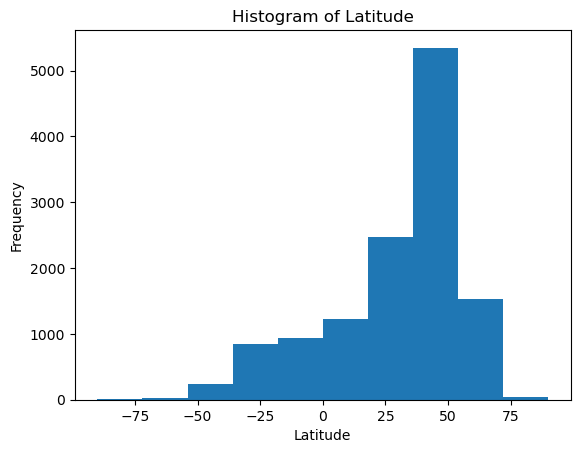

In [14]:
plt.hist(df_full["Latitude"])
plt.xlabel("Latitude")
plt.ylabel("Frequency")
plt.title("Histogram of Latitude")
plt.show()



In this histogram, we can observe that the frequency is over 5000 at latitude 50, which could indicate a high density of airports located at that latitude.

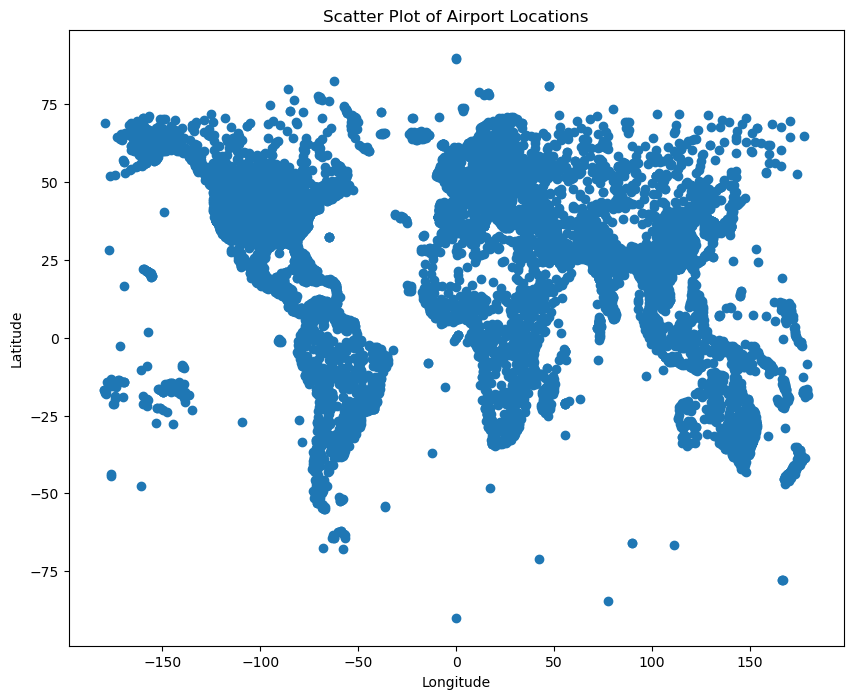

In [15]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 8))

ax.scatter(df_full["Longitude"], df_full["Latitude"])
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Scatter Plot of Airport Locations")

plt.show()


Looking at the world map of airport locations, we can see that there is a higher concentration of airports along the coastlines and major cities. This is likely due to the fact that these areas tend to have higher populations and greater economic activity, which in turn creates a higher demand for air travel. While some countries, such as Canada, may have a high number of airports overall, the distribution of airports within the country can also be influenced by factors such as geography, population density, and economic activity.

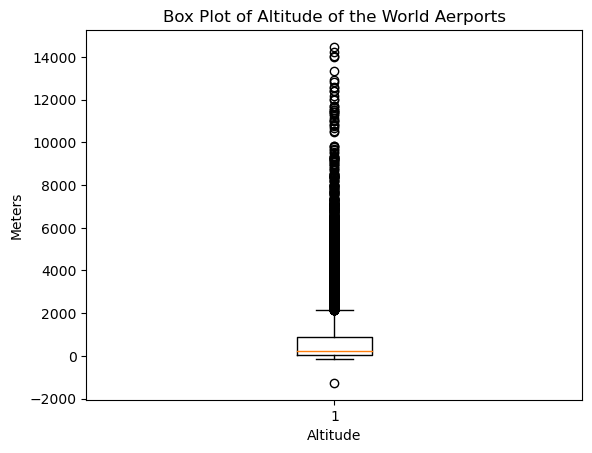

In [16]:
plt.boxplot(df_full["Altitude"])
plt.xlabel("Altitude")
plt.ylabel("Meters")
plt.title("Box Plot of Altitude of the World Aerports")
plt.show()

This box plot of altitude for airports around the world, we can observe that the median altitude is around 200 meters, with the majority of the airports having an altitude range between 0 and 2000 meters. However, there are a few outliers that exceed this range and are likely to be airports located in high altitude regions such as the Himalayas or the Andes.

Next, we are going to filter the data to show only the rows with missing values in the "City" column.

In [17]:
missing_city = df[df["City"].isnull()]
missing_city

,Name,City,Country,IATA,ICAO,Timezone,DST,TZ,Type,source
10351,Minsk Mazowiecki Military Air Base,NaN,Poland,\N,EPMM,\N,\N,\N,airport,OurAirports
10352,Powidz Military Air Base,NaN,Poland,\N,EPPW,\N,\N,\N,airport,OurAirports
10457,King Salman Abdulaziz Airport,NaN,Saudi Arabia,DWD,OEDM,\N,\N,\N,airport,OurAirports
10458,King Khaled Air Base,NaN,Saudi Arabia,KMX,OEKM,\N,\N,\N,airport,OurAirports
10478,Asahikawa Airfield,NaN,Japan,\N,RJCA,\N,\N,\N,airport,OurAirports
10480,Utsunomiya Airport,NaN,Japan,\N,RJTU,\N,\N,\N,airport,OurAirports
10481,Jungwon Air Base/Chungju Airport,NaN,South Korea,\N,RKTI,\N,\N,\N,airport,OurAirports
10484,Bislig Airport,NaN,Philippines,BPH,RPMF,\N,\N,\N,airport,OurAirports
10485,Mati National Airport,NaN,Philippines,MXI,RPMQ,\N,\N,\N,airport,OurAirports
10504,Metropolitano Airport,NaN,Venezuela,\N,SVMP,\N,\N,\N,airport,OurAirports


The following, **df.describe(include="object")**, provides a statistical summary of only the columns in the DataFrame that have an object data type. This can be useful for understanding the distribution of categorical data in your dataset, such as the frequency of different categories in a particular column.

In [18]:
df.describe(include="object")

,Name,City,Country,IATA,ICAO,Timezone,DST,TZ,Type,source
count,12668,12619,12668,12668,12667,12668,12668,12668,12668,12668
unique,12330,9673,241,6925,8161,42,8,312,5,4
top,North Sea,New York,United States,\N,\N,1,E,\N,airport,OurAirports
freq,21,50,2708,5744,4507,2706,3478,4282,8264,7698


This DataFrame has changed, from the previous one, showing only the first four rows because the other information was dropped from the DataFrame. In our case, since df_alla has only the columns Name, City, Country, IATA, ICAO, Timezone, DST, TZ, Type, and source, the **describe()** method for **df_alla** will only display a summary for these columns, not for the other columns (AirportID, Latitude, Longitude, and Altitude) that were dropped from the DataFrame.

In [19]:
df.describe(include="all")

,Name,City,Country,IATA,ICAO,Timezone,DST,TZ,Type,source
count,12668,12619,12668,12668,12667,12668,12668,12668,12668,12668
unique,12330,9673,241,6925,8161,42,8,312,5,4
top,North Sea,New York,United States,\N,\N,1,E,\N,airport,OurAirports
freq,21,50,2708,5744,4507,2706,3478,4282,8264,7698


In [20]:
df.describe().index

Index(['count', 'unique', 'top', 'freq'], dtype='object')

In [21]:
df.describe()

,Name,City,Country,IATA,ICAO,Timezone,DST,TZ,Type,source
count,12668,12619,12668,12668,12667,12668,12668,12668,12668,12668
unique,12330,9673,241,6925,8161,42,8,312,5,4
top,North Sea,New York,United States,\N,\N,1,E,\N,airport,OurAirports
freq,21,50,2708,5744,4507,2706,3478,4282,8264,7698


### *6. In the statistical summary above it seems that in column TZ there is a rare value \N, check the proportion of them with value_counts.*

In this case, we can realise that there are several \N values, so we can check the proportion of occurrences of \N in all columns of the DataFrame, so we can use a for loop to iterate over the columns and apply the above code to each column getting the proportion of occurrences of \N in each column of the DataFrame.

Then we are going to normalize the values: IATA, TZ and ICAO.

In [22]:
prop_N = (df_full['IATA'] == '\\N').value_counts(normalize=True)
print(prop_N)

False    0.546574
True     0.453426
Name: IATA, dtype: float64


In [23]:
prop_N = (df_full['TZ'] == '\\N').value_counts(normalize=True)
print(prop_N)

False    0.661983
True     0.338017
Name: TZ, dtype: float64


In [24]:
prop_N = (df_full['ICAO'] == '\\N').value_counts(normalize=True)
print(prop_N)

False    0.644222
True     0.355778
Name: ICAO, dtype: float64


In [25]:
for col in df_full.columns:
    prop_N = (df_full[col] == '\\N').value_counts(normalize=True)
    print(col, prop_N)

AirportID False    1.0
Name: AirportID, dtype: float64
Name False    1.0
Name: Name, dtype: float64
City False    1.0
Name: City, dtype: float64
Country False    1.0
Name: Country, dtype: float64
IATA False    0.546574
True     0.453426
Name: IATA, dtype: float64
ICAO False    0.644222
True     0.355778
Name: ICAO, dtype: float64
Latitude False    1.0
Name: Latitude, dtype: float64
Longitude False    1.0
Name: Longitude, dtype: float64
Altitude False    1.0
Name: Altitude, dtype: float64
Timezone False    0.972135
True     0.027865
Name: Timezone, dtype: float64
DST False    0.972135
True     0.027865
Name: DST, dtype: float64
TZ False    0.661983
True     0.338017
Name: TZ, dtype: float64
Type False    0.869672
True     0.130328
Name: Type, dtype: float64
source False    0.869672
True     0.130328
Name: source, dtype: float64


### *7. Reload the dataset so that null values are correctly interpreted (repeat section 4, delete columns).*

In [26]:
df = pd.read_csv("airports-extended.csv", 
                 header=None, 
                 names=["AirportID","Name","City","Country","IATA","ICAO",
                        "Latitude","Longitude","Altitude","Timezone","DST","TZ","Type","source"],
                     na_values='\\N')


df.head(10)


,AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,TZ,Type,source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10.0,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10.0,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10.0,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10.0,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10.0,U,Pacific/Port_Moresby,airport,OurAirports
5,6,Wewak International Airport,Wewak,Papua New Guinea,WWK,AYWK,-3.583830,143.669006,19,10.0,U,Pacific/Port_Moresby,airport,OurAirports
6,7,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,BGBW,61.160500,-45.425999,112,-3.0,E,America/Godthab,airport,OurAirports
7,8,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,BGGH,64.190903,-51.678101,283,-3.0,E,America/Godthab,airport,OurAirports
8,9,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,BGSF,67.012222,-50.711603,165,-3.0,E,America/Godthab,airport,OurAirports
9,10,Thule Air Base,Thule,Greenland,THU,BGTL,76.531197,-68.703201,251,-4.0,E,America/Thule,airport,OurAirports


In [27]:
df.drop(["AirportID", "Latitude","Longitude","Altitude"], axis=1, inplace=True)
df


,Name,City,Country,IATA,ICAO,Timezone,DST,TZ,Type,source
0,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,10.0,U,Pacific/Port_Moresby,airport,OurAirports
1,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,10.0,U,Pacific/Port_Moresby,airport,OurAirports
2,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,10.0,U,Pacific/Port_Moresby,airport,OurAirports
3,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,10.0,U,Pacific/Port_Moresby,airport,OurAirports
4,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,10.0,U,Pacific/Port_Moresby,airport,OurAirports
...,...,...,...,...,...,...,...,...,...,...
12663,Ulan-Ude East Airport,Ulan Ude,Russia,NaN,XIUW,NaN,NaN,NaN,airport,OurAirports
12664,Krechevitsy Air Base,Novgorod,Russia,NaN,ULLK,NaN,NaN,NaN,airport,OurAirports
12665,Desierto de Atacama Airport,Copiapo,Chile,CPO,SCAT,NaN,NaN,NaN,airport,OurAirports
12666,Melitopol Air Base,Melitopol,Ukraine,NaN,UKDM,NaN,NaN,NaN,airport,OurAirports


### *8.Check the entire dataframe for null values.*

In [28]:
df.isnull().sum()

Name           0
City          49
Country        0
IATA        5744
ICAO        4508
Timezone     353
DST          353
TZ          4282
Type        1651
source      1651
dtype: int64

The output of **df.isnull().sum()** we can see that there are null or missing values in the columns "City", "IATA","ICAO","Timezone", "DST", "TZ", "Type" and "source". The other columns have no missing values.

### *9. Overwrites the null values of the IATA and ICAO columns with the value 'UNKNOWN'*

In [29]:
df.IATA.fillna("UNKNOWN", inplace=True)
df.ICAO.fillna("UNKNOWN", inplace=True)
df.head(10)

,Name,City,Country,IATA,ICAO,Timezone,DST,TZ,Type,source
0,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,10.0,U,Pacific/Port_Moresby,airport,OurAirports
1,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,10.0,U,Pacific/Port_Moresby,airport,OurAirports
2,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,10.0,U,Pacific/Port_Moresby,airport,OurAirports
3,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,10.0,U,Pacific/Port_Moresby,airport,OurAirports
4,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,10.0,U,Pacific/Port_Moresby,airport,OurAirports
5,Wewak International Airport,Wewak,Papua New Guinea,WWK,AYWK,10.0,U,Pacific/Port_Moresby,airport,OurAirports
6,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,BGBW,-3.0,E,America/Godthab,airport,OurAirports
7,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,BGGH,-3.0,E,America/Godthab,airport,OurAirports
8,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,BGSF,-3.0,E,America/Godthab,airport,OurAirports
9,Thule Air Base,Thule,Greenland,THU,BGTL,-4.0,E,America/Thule,airport,OurAirports


### *10. Changes the type of the DST and TZ variables to categorical.*

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12668 entries, 0 to 12667
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Name      12668 non-null  object 
 1   City      12619 non-null  object 
 2   Country   12668 non-null  object 
 3   IATA      12668 non-null  object 
 4   ICAO      12668 non-null  object 
 5   Timezone  12315 non-null  float64
 6   DST       12315 non-null  object 
 7   TZ        8386 non-null   object 
 8   Type      11017 non-null  object 
 9   source    11017 non-null  object 
dtypes: float64(1), object(9)
memory usage: 989.8+ KB


In [31]:
df["DST"] = pd.Categorical(df["DST"])
df["TZ"] = pd.Categorical(df["TZ"])

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12668 entries, 0 to 12667
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   Name      12668 non-null  object  
 1   City      12619 non-null  object  
 2   Country   12668 non-null  object  
 3   IATA      12668 non-null  object  
 4   ICAO      12668 non-null  object  
 5   Timezone  12315 non-null  float64 
 6   DST       12315 non-null  category
 7   TZ        8386 non-null   category
 8   Type      11017 non-null  object  
 9   source    11017 non-null  object  
dtypes: category(2), float64(1), object(7)
memory usage: 839.9+ KB


### *11. Obtain a statistical summary of the categorical variables.*

In [33]:
df.describe(include="category")

,DST,TZ
count,12315,8386
unique,7,311
top,E,America/New_York
freq,3478,705


As we can see, there are two categorical variables: "DST" and "TZ". "DST" has 12.315 non-null values and 7 unique values, with the most frequent value being "E". "TZ" has 8.386 non-null values and 311 unique values, with the most frequent value being "America/New_York" with a frequency of 705.

### *12. Groups the dataframe by airport type, showing the type count.*

In [34]:
df.groupby(["Type"]).count()["Name"]

Type
airport    8264
port        101
station    1332
unknown    1320
Name: Name, dtype: int64

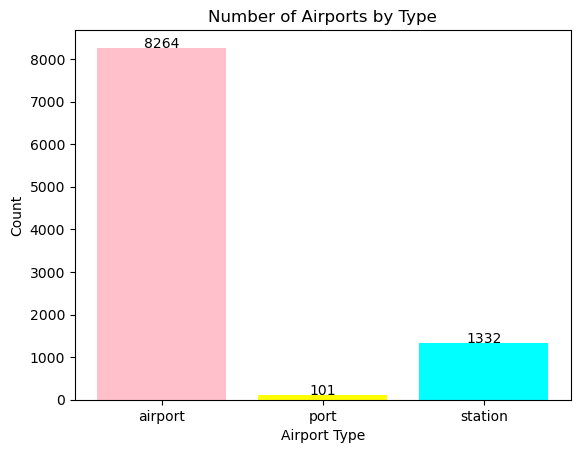

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

# Group the dataframe by airport type, excluding "unknown" and "not identified"
grouped_df = df[~df["Type"].isin(["unknown"])].groupby("Type").size()

# Get the total number of each airport type
type_counts = df.groupby("Type").count()["Name"]

# Define the colors for the bars
colors = ["pink", "yellow", "cyan"]

# Create a bar chart of the type counts
plt.bar(grouped_df.index, grouped_df.values, color=colors)
plt.xlabel("Airport Type")
plt.ylabel("Count")
plt.title("Number of Airports by Type")

# Add total number of each airport type to the bar chart
for i, v in enumerate(grouped_df.values):
    plt.text(i, v+10, str(type_counts[grouped_df.index[i]]), color='black', ha='center')

plt.show()


We can see that the number of airports, ports, and stations in the dataset are 8264 airports, 101 ports, and 1332 stations. The majority of the locations in the dataset are airports. This information can be useful for understanding the distribution and variety of this forms of transportation in the world.

### *13. Select the name of the cities whose airport type is "port"*

In [36]:
df.loc[df["Type"] == "port", ["Name", "City", "Type"]]


,Name,City,Type
6074,Macau Ferry Pier,Macau,port
6438,Stockholm Cruise Port,Stockholm,port
6439,Helsingborg Cruise Port,Helsingborg,port
6444,Helsinki Cruise Port,Helsinki,port
6565,Sakaiminato Port,Sakaiminato,port
...,...,...,...
9948,Ludington Ferry Terminal,Ludington,port
9949,Manitowoc Ferry Terminal,Manitowoc,port
10184,Fuyong Ferry Terminal,Shenzhen,port
10207,Osaka Port International Ferry Terminal,Osaka,port


In this dataframe, we can observe all the cities that have a port.

### *14. Shows all the rows of the fields name of the airport, name of the country and, name of the city, whose country is Spain.*

In [37]:
df.loc[df["Country"] == "Spain", ["City", "Country", "Name"]]


,City,Country,Name
1030,Fuerteventura,Spain,Fuerteventura Airport
1031,Hierro,Spain,Hierro Airport
1032,Santa Cruz De La Palma,Spain,La Palma Airport
1033,Gran Canaria,Spain,Gran Canaria Airport
1034,Arrecife,Spain,Lanzarote Airport
...,...,...,...
11437,Madrid,Spain,Madrid Estacion Sur
11438,Granada,Spain,Granada Bus Station
11879,Palma de Mallorca,Spain,Palma de Mallorca Cruise Terminal
12234,Algeciras,Spain,Algeciras Heliport


As we can see, there are 145 rows with cities in Spain where we can find airports, ports, and train stations.

### *15. Shows the name of the country and the airport belonging to the city of Madrid and Barcelona. Are all the records from Spain?*

In [38]:
df_spain = df.loc[(df["City"] == "Madrid") | (df["City"] == "Barcelona"), ["Country", "Name", "City"]]
df_spain

,Country,Name,City
1188,Spain,Barcelona International Airport,Barcelona
1194,Spain,Getafe Air Base,Madrid
1198,Spain,Adolfo Suárez Madrid–Barajas Airport,Madrid
1214,Spain,Torrejón Airport,Madrid
1217,Spain,Cuatro Vientos,Madrid
2690,Venezuela,General José Antonio Anzoategui International ...,Barcelona
6302,Spain,Barcelona Cruise Terminal,Barcelona
8046,Spain,Atocha,Madrid
8053,Spain,Chamartin Station,Madrid
8055,Spain,Aeroport,Barcelona


It seems that Venezuela has appeared in the result! This is because there is also a city named Barcelona in Venezuela.

### *16. Save the previous results in a csv called Madrid_Barcelona.csv*

In [39]:
df_spain.to_csv("Madrid_Barcelona.csv", index=False, sep=",", encoding="utf8")

## Columns descriptions:

* ***AirportID***: Identifier of each flight for an airport.
* ***Name***: Name of the airport.
* ***City***: City where the airport is located.
* ***Country***: Country or territory in which the airport is located.
* ***IATA***: International Air Transport Association code, airport code.
* ***ICAO***: International civil organization code, airport code.
* ***Latitude***: Coordinate of the airport (latitude).
* ***Longitude***: Airport coordinate (longitude).
* ***Altitude***: Altitude of the airport (in feet).
* ***Timezone***: Time zone.
* ***DST***: Code referring to the continent (Daylight savings time). Europe (E), A (US/CANADA), S (South America), O (Australia), Z (New Zeeland), N (None), U (Unknown).
* ***Tz***: Airport time zone. For example: (America/Los_Angeles).
* ***Type***: Type of airport: airport, station, port, unknown.
* ***Source***: Data source.


# Air Occurences in Canada 

<p align="center"> <img src="https://assets.sentinelassam.com/h-upload/2022/03/22/1600x960_327499-63-0-b1903-660x4002x.jpg"> </p>   


## Introduction 
As stated by the **International Civil Aviation Organization** ([ICAO](https://www.iata.org/en/youandiata/travelers/aviation-safety/)), **safety** is the highest priority of all involved in aviation. The shared goal is for every flight to take-off and land safely, as happens more than 126,000 times every day. 

In **Canada**, the aviation industry is regulated by [Transport Canada](https://tc.canada.ca/en). Air traffic services are provided by [Nav Canada](https://www.navcanada.ca/en/).

Data collection and analysis is a key factor in the safety management systems. It helps investigations and defines efficient regulations and procedures.  

## Content of this notebook  
In this notebook, we will analyze aviation occurrence data provided by [Transport Canada](https://www.bst-tsb.gc.ca/eng/stats/aviation/data-5.html). We will download the data, and after some cleaning and organizing, we will show plots of multiple aspects of these events.

We will investigate the following points:
1. The airports of Canada
2. What is the number of events reported in each country?
3. When did the incidents happen?
4. Are there any periods of the year where more events take place?
5. Impact of environmental factors on aviation safety
6. Breakdown of aviation occurrences by sky conditions
7. Breakdown of aviation occurrences by weather condition
8. Impact of visibility on aviation safety
9. Impact of weather phenomena on flight safety
10. Number of fatal injuries reported each year
11. Number of serious injuries reported each year
12. Visualizing the total number of accidents
13. Visualization of airplane crashes

Before diving into the data, let's define some terminology:
- **Occurrence**: Any event which is irregular, unplanned, or non-routine, including any aircraft accident, incident, or other occurrences.
- **Accident**: An occurrence associated with the operation of an aircraft which takes place between the time any person boards the aircraft with the intention of flight until all such persons have disembarked, in which:  
- **Incident**: An occurrence, other than an accident, associated with the operation of an aircraft that affects or could affect the safety of operation.
- **Serious Incident**: An incident involving circumstances indicating that an accident nearly occurred.

In [40]:
# importing python libraries
import urllib.request
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import os
import numpy as np
import plotly.express as px

# Libraries to make the graphs of latitude and longitude
import geopandas as gpd
from shapely.geometry import Point, LineString
import matplotlib.pyplot as plt
from descartes import PolygonPatch
import contextily as ctx
plt.rcParams['figure.dpi'] = 600

# Setting plots parameters
%matplotlib inline
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 1
matplotlib.rcParams['figure.figsize'] = (18, 10)
matplotlib.rcParams['figure.facecolor'] = '#00000000'
# 
import warnings
warnings.filterwarnings("ignore")

## Datasets used in this study  
The data is divided into five (5) data frames:  
- **Occurrence table**: This table contains data on the occurrence summary, including the date, time, and location of the occurrence, the occurrence type and category, the occurrence classification, the aircraft involved, the number of injuries/or fatalities, the weather conditions, and data relating to the landing and takeoff aerodrome or operating surface.  
- **Airports table**: This dataset contains all the data from airports and will be very useful for conducting a broader study.

## 1st step: download the dataset  
We use the `urllib` library to download the `csv` files. We start by defining the different URLs used in this project:

In [41]:
occurence_table_url = 'https://www.bst-tsb.gc.ca/includes/stats/csv/Air/ASISdb_MDOTW_VW_OCCURRENCE_PUBLIC.csv'

In the next section, we download the data and tackle some encoding errors.

In [42]:
files = ['occurence.csv']
urls = [occurence_table_url]
encoding = 'ISO-8859-1'
for filename,url in zip(files,urls):
    if filename not in os.listdir():
        print('Downloading', filename)
        urllib.request.urlretrieve(url, filename)
        # in order to avoid formatting errors, we have to replace all "–" by "-"
    print('formatting ',filename)    
    # Read in the file
    with open(filename, 'r', encoding=encoding) as file:
        filedata = file.read()

    #Replace the target string
    filedata = filedata.replace('â\x80\x93', '-')

    # Write the file out again
    with open(filename, 'w', encoding=encoding) as file:
        file.write(filedata)

formatting  occurence.csv


The occurance csv we download we can see the number of each column of the data frame.

In [43]:
occurence_df = pd.read_csv('occurence.csv',encoding = encoding)
print('Total number of columns', occurence_df.shape[0])

Total number of columns 50658


After looking into `occurence_df`, we have decided to keep the following columns for this study: 

In [44]:
occurence_sel_columns = ['OccNo','CountryID_DisplayEng',
'ICAO_DisplayEng', 'OccDate', 'OccRegionID_DisplayEng', 'OccTime', 'OccTypeID_DisplayEng',
'TotalFatalCount','TotalSeriousCount',
'InjuriesEnum_DisplayEng', 'LightCondID_DisplayEng','SkyCondID_DisplayEng', 
'GeneralWeatherID_DisplayEng', 'VisibilyCeiling', 'Visibility', 'WeatherPhenomenaTypeID_DisplayEng', 'Summary',
'RunwaySurfaceID_DisplayEng', 'SurfaceContaminationID_DisplayEng','TimeZoneID_DisplayEng']

The next step is to load data using `pandas` library.

In [45]:
occurence_df = pd.read_csv('occurence.csv',encoding = encoding,usecols=occurence_sel_columns)

The first information I was curious about was how many unique occurrences are presented in the datasets?

In [46]:
print('Number of aviation occurrences',occurence_df.shape[0])

Number of aviation occurrences 50658


## The airports of Canada

After having established "occurences", we are going to visualize the map of Canada to see the number of airports it has. Each lime-colored dot represents an airport.

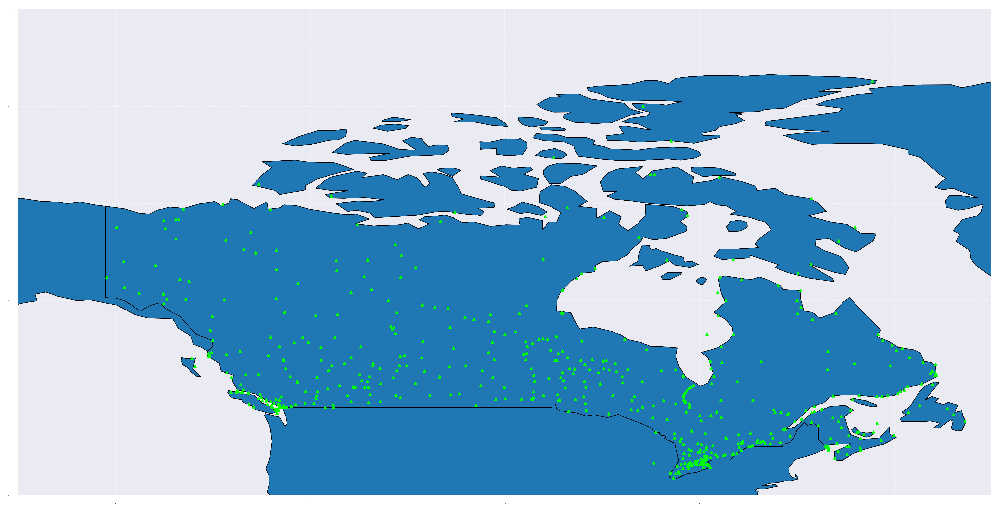

In [47]:
# Librerias necesarias
import pandas as pd
import numpy as np
# Libraries to make the graphs of latitude and longitude
import geopandas as gpd
from shapely.geometry import Point, LineString
import matplotlib.pyplot as plt
from descartes import PolygonPatch

# Load a shapefile of world countries
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Define the latitude and longitude values of some points
latitudes = df_full[df_full['Country'] == 'Canada']['Latitude'] # base de datos de accidentes ['latitud']
longitudes = df_full[df_full['Country'] == 'Canada']['Longitude']
points = [Point(lon, lat) for lon, lat in zip(longitudes, latitudes)]

# Convert the points to a GeoDataFrame
geo_points = gpd.GeoDataFrame(geometry=points)

# Set up a plot of the world map
fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, edgecolor='k', linewidth = 0.5)

# Plot the points on the map
geo_points.plot(ax=ax, color='lime', marker = '^', markersize=3)
plt.grid(which = 'major', linestyle = ':')

# Set the x-axis limits to cover the range of -180 to 180
plt.xlim(-150, -50)

# Set the y-axis limits to cover the range of -90 to 90
plt.ylim(40, 90)

# Show the plot
plt.show()

Then, I was curious about what is the total number of airports in Canada?

In [48]:
total_airports_canada = (df["Country"] == "Canada").sum()
print("The total number of airports in Canada is:", total_airports_canada)


The total number of airports in Canada is: 640


Let's  look at the countries where occurrences were reported:

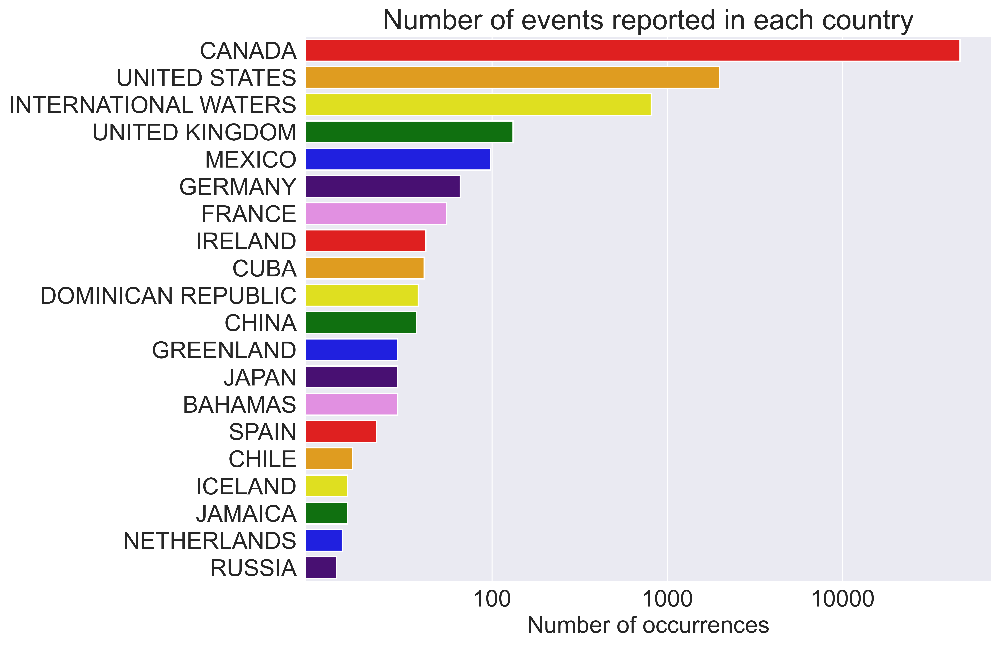

In [49]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Set the default size of the plots and font size
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['font.size'] = 19

# Define the column to group by
column = 'CountryID_DisplayEng'

# Group the occurrences by the selected column and count the number of occurrences per group
graph = occurence_df.groupby(column)['OccNo'].count().sort_values(ascending=False).head(20)

# Define the colors to use in the bar plot (rainbow colors)
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

# Create a bar plot of the grouped data, using the specified colors
fig = sns.barplot(x=graph.values, y=graph.index, palette=colors)

# Set the x-axis scale to logarithmic scale
fig.set_xscale('log')

# Set the labels and title of the chart
fig.set(xlabel='Number of occurrences', ylabel='', title='Number of events reported in each country')

# Set the tick marks and labels for the x-axis
fig.set_xticks([100, 1000, 10000])
fig.set_xticklabels([100, 1000, 10000])

# Show the chart
plt.show()

As we can see, Canada is the country with the most reports and that is why the analysis of this country is of our interest.

## When did the incidents happen?
Date information requires some transformations to extract interesting insights.

In [50]:
occurence_df['OccDate'] = pd.to_datetime(occurence_df['OccDate'])
occurence_df['OccYear'] = occurence_df['OccDate'].dt.year
occurence_df['OccMonth'] = occurence_df['OccDate'].dt.month
occurence_df['OccWeekday'] = occurence_df['OccDate'].dt.weekday

First, we display the number of events reported every year.

Text(0.5, 1.0, 'Number of occurrences reported each year')

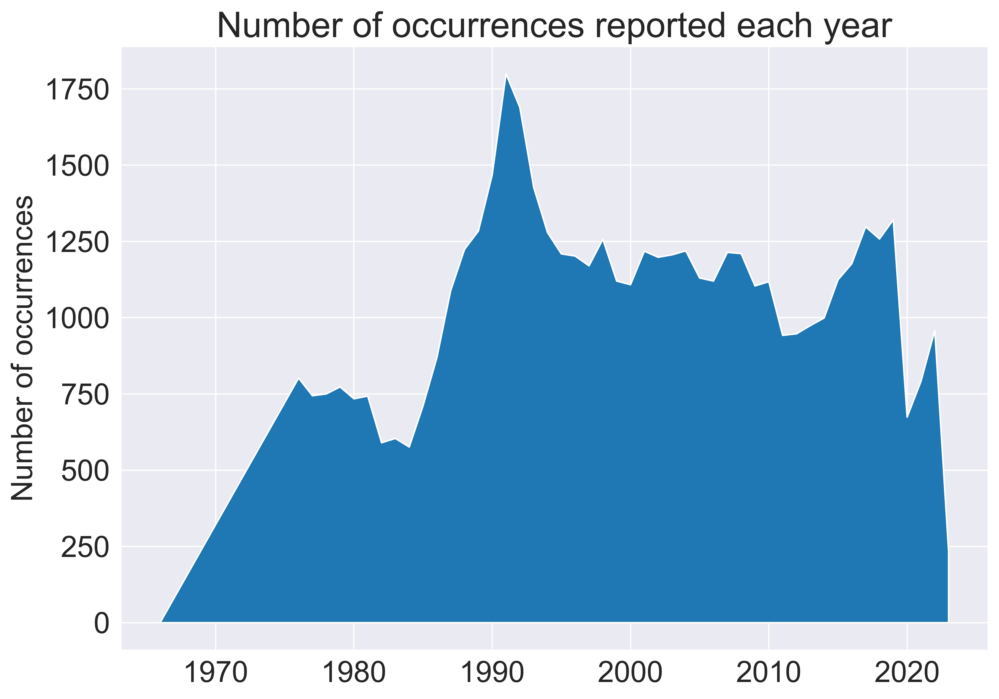

In [51]:
matplotlib.rcParams['figure.figsize'] = (10, 7)
column = 'OccYear'
# We use the data from the year 1965 because that is the year from which the data began to be recorded
data = occurence_df[occurence_df[column]>1965].dropna(subset=[column])
data2= data.groupby(column)['OccNo'].count()
plt.fill_between(data2.index, data2.values)
plt.xlabel('')
plt.ylabel('Number of occurrences')
plt.title('Number of occurrences reported each year')

We have excluded events before 1965 due to the low number of reported events. The number of occurrences seems to be steady since the 90s, with a slight tendency to decrease. 
We can also observe that between 2015 and 2020 there is a greater number of accidents, we deduce that it is due to the increase in aircraft circulation.
As well, due to the times of Covid in 2020 we can see that the number of occurences also decreased.

## Are there any periods of the year where more events take place?

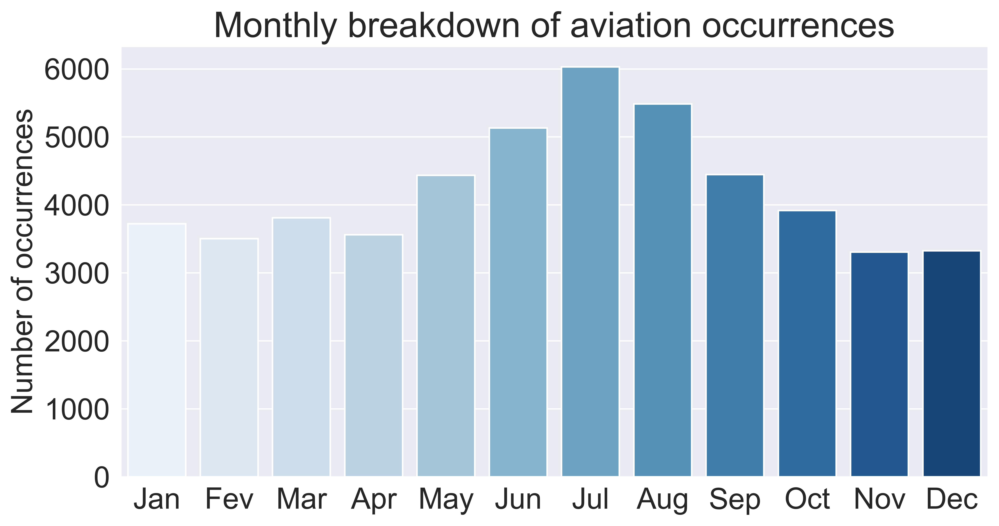

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = (10, 5)

column = 'OccMonth'

# Generate a gradient of blue color
colors = sns.color_palette("Blues", n_colors=12)

fig = sns.countplot(x=column, data=occurence_df.dropna(subset=[column]), palette=colors)
fig.set(xlabel='', ylabel='Number of occurrences', title='Monthly breakdown of aviation occurrences')
months = ['Jan','Fev','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig.set_xticklabels(months)

plt.show()


And the answer is Yes! It turns out that more events happen during the summer months. This is due to a higher density of traffic during summer.

Can we have similar deductions if we consider weekdays?

## Impact of environmental factors on aviation safety
Multiple environment variables could affect flight progress. The first parameter we consider is light condition.

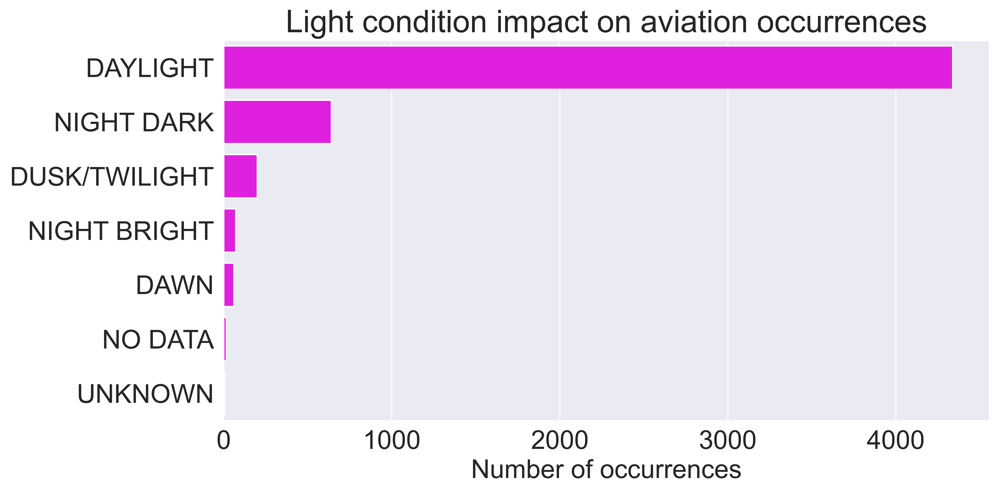

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

matplotlib.rcParams['figure.figsize'] = (10, 5)

column = 'LightCondID_DisplayEng'

graph = occurence_df.groupby(column)['OccNo'].count().sort_values(ascending=False)

fig = sns.barplot(x=graph.values, y=graph.index, color='magenta')

fig.set(xlabel='Number of occurrences', ylabel='', title='Light condition impact on aviation occurrences')
plt.show()


## Breakdown of aviation occurrences by sky conditions

Let's consider sky conditions impact:

[Text(0.5, 0, 'Number of occurrences'),
 Text(0, 0.5, ''),
 Text(0.5, 1.0, 'Breakdown of aviation occurrences by sky conditions')]

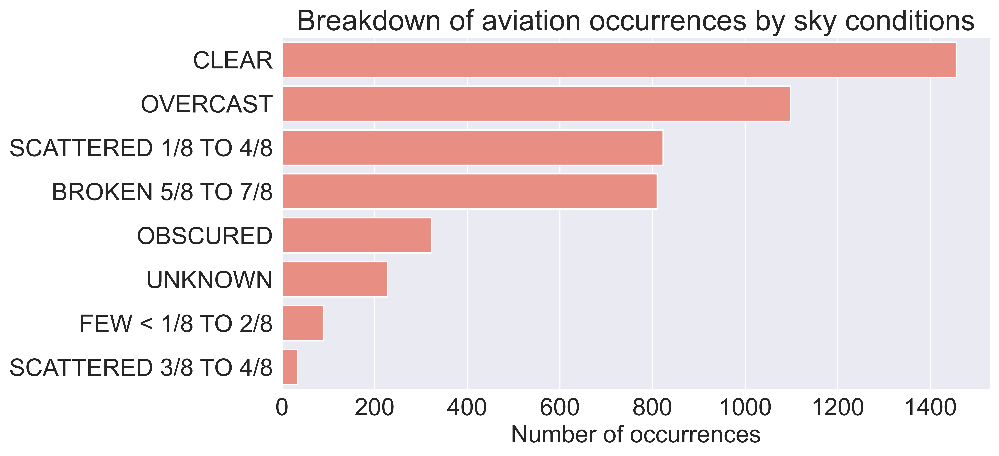

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the size of the figure
plt.rcParams['figure.figsize'] = (10, 5)

# Select the column to group occurrences by
column = 'SkyCondID_DisplayEng'

# Group the occurrences by the selected column and count them
occurrences_by_sky = occurence_df.groupby(column)['OccNo'].count().sort_values(ascending=False)

# Create a bar plot of the number of occurrences for each sky condition
fig = sns.barplot(x=occurrences_by_sky.values, y=occurrences_by_sky.index, color='salmon')

# Set the x and y axis labels, as well as the title of the plot
fig.set(xlabel='Number of occurrences', ylabel='', title='Breakdown of aviation occurrences by sky conditions')


Based on this data, it appears that occurrences happen more often in a clear sky.

## Breakdown of aviation occurrences by weather condition

Another weather-related parameter is the visual (VMC)/instrument (IMC) weather condition. According to Canadian regulations, this refers to visibility being above or less than 3 nautical miles. The definition can vary in other countries.

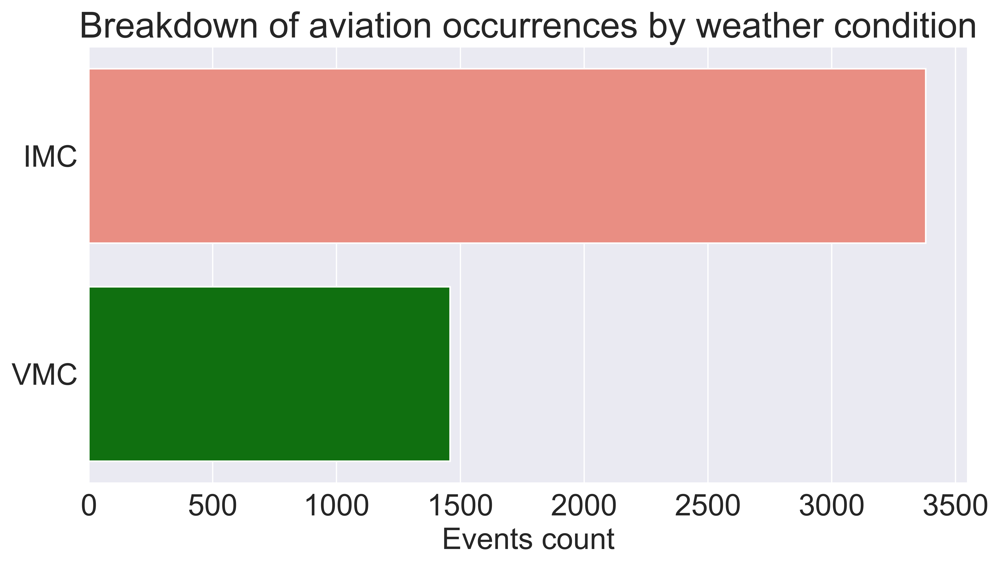

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the figure size
plt.rcParams['figure.figsize'] = (10, 5)

# Define the column to analyze and filter out unknown values and missing data
column = 'GeneralWeatherID_DisplayEng'
data = occurence_df[occurence_df[column] != 'UNKNOWN'].dropna(subset=[column])

# Create the countplot with salmon and green colors
fig = sns.countplot(y=column, data=data, order=data[column].value_counts().index, palette=["salmon", "green"])

# Set the x and y labels and title for the plot
fig.set(xlabel='Events count', ylabel='', title='Breakdown of aviation occurrences by weather condition')

# Show the plot
plt.show()


Events happen more often in IMC conditions, where visibility is low. In aviation, visibility is described using two parameters: visibility ceiling (vertical visibility) and visibility (horizontal visibility).

## Impact of visibility on aviation safety

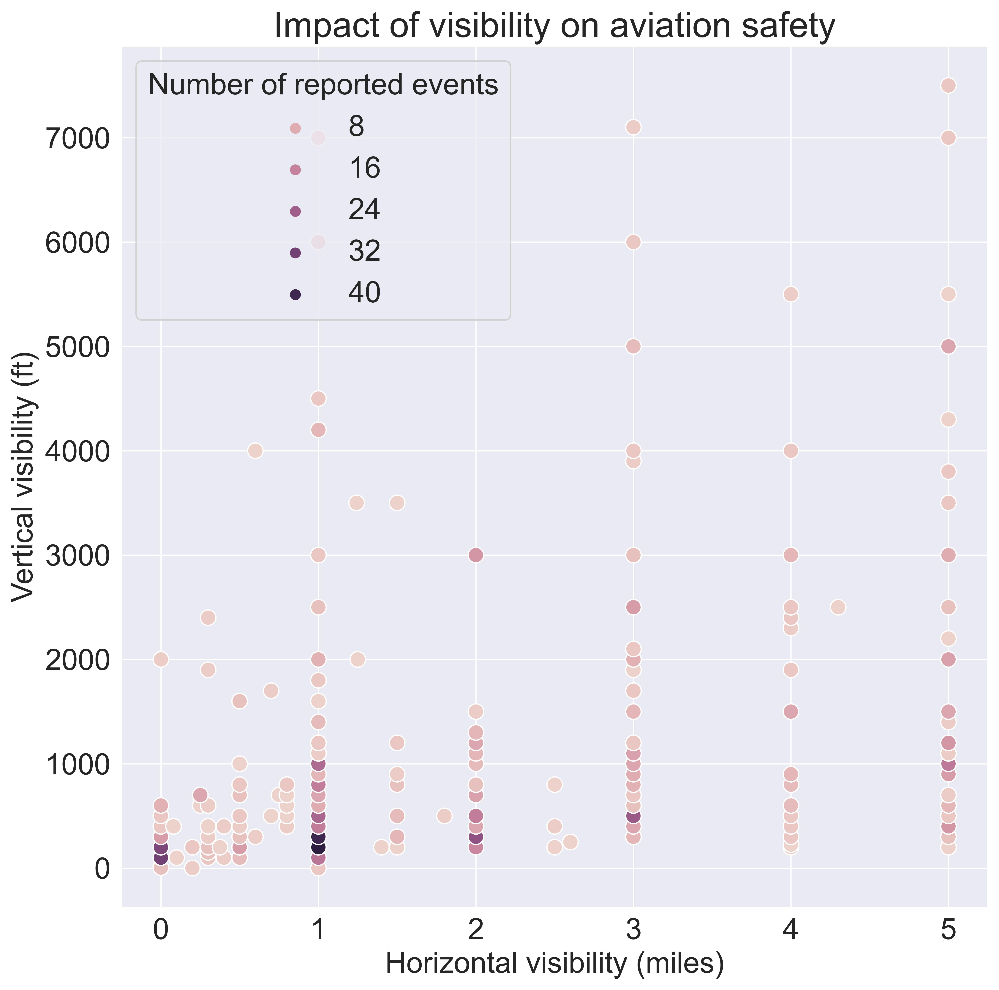

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size
plt.rcParams['figure.figsize'] = (10, 10)

# Filter data by visibility and ceiling conditions
data = occurence_df[(occurence_df['VisibilyCeiling'] < 8000) & (occurence_df['Visibility'] < 6)]

# Group by visibility and ceiling and count occurrences
data = data.groupby(['VisibilyCeiling', 'Visibility'])['OccNo'].count()

# Create scatterplot
fig = sns.scatterplot(x='Visibility', y='VisibilyCeiling', hue=data.values, data=data, s=100)

# Set axis labels and title
fig.set(xlabel='Horizontal visibility (miles)', ylabel='Vertical visibility (ft)', title='Impact of visibility on aviation safety')

# Set legend title
fig.legend(title='Number of reported events')

Aviation accidents and incidents are more likely to happen in low visibility conditions. These conditions are usually referred to as **marginal** and can change quickly. They affect mainly VFR (visual flight rules) aircraft that are not certified and equipped to fly using IFR (instrument flight rules).  

Many other weather phenomena can affect safety as shown in the following plot.

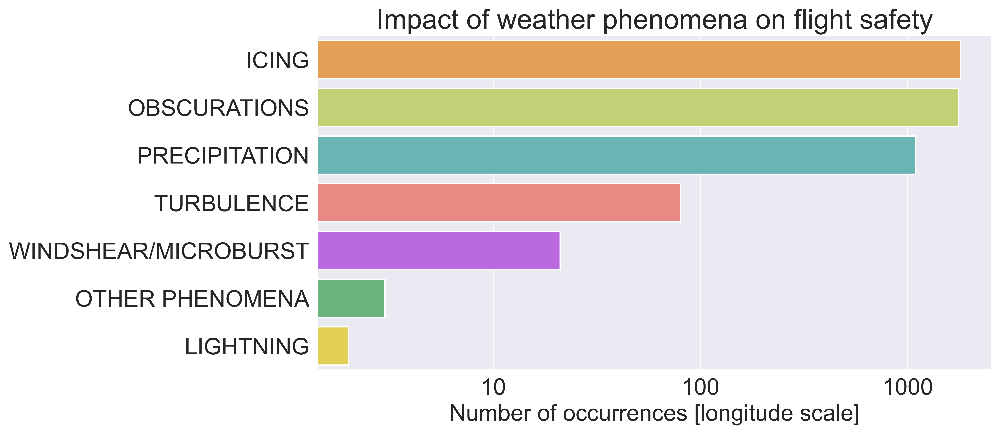

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the figure size
plt.rcParams['figure.figsize'] = (10, 5)

# Define the column to analyze and get the top 7 values
column = 'WeatherPhenomenaTypeID_DisplayEng'
graph = occurence_df.groupby(column)['OccNo'].count().sort_values(ascending=False).head(7)

# Create the barplot with random colors
fig = sns.barplot(x=graph.values, y=graph.index, palette=['#F9A03F', '#C9E265', '#5EC1C0', '#F97B72', '#C355F5', '#5EC17A', '#F9E03F'])

# Set the x and y labels and title for the plot
fig.set(xlabel='Number of occurrences [longitude scale]', ylabel='', title='Impact of weather phenomena on flight safety')
fig.set_xscale('log')
fig.set_xticks([10, 100, 1000])
fig.set_xticklabels([10, 100, 1000])

# Show the plot
plt.show()


The top 3 weather conditions affecting aviation are **icing**, **obscuration**, and **precipitation**. **Turbulence** is a very serious concern, especially when it is categorized as *moderate* or *severe*. Among the less recurrent but most dangerous phenomena are **wind shear**, **Microburst**, and **lightning**. These three conditions are difficult to forecast and can cause substantial damages in a short time.  

## Number of fatal injuries reported each year

 Let's focus now on the accidents, and plot the number of deaths reported every year:

Text(0.5, 1.0, 'Number of fatal injuries reported each year')

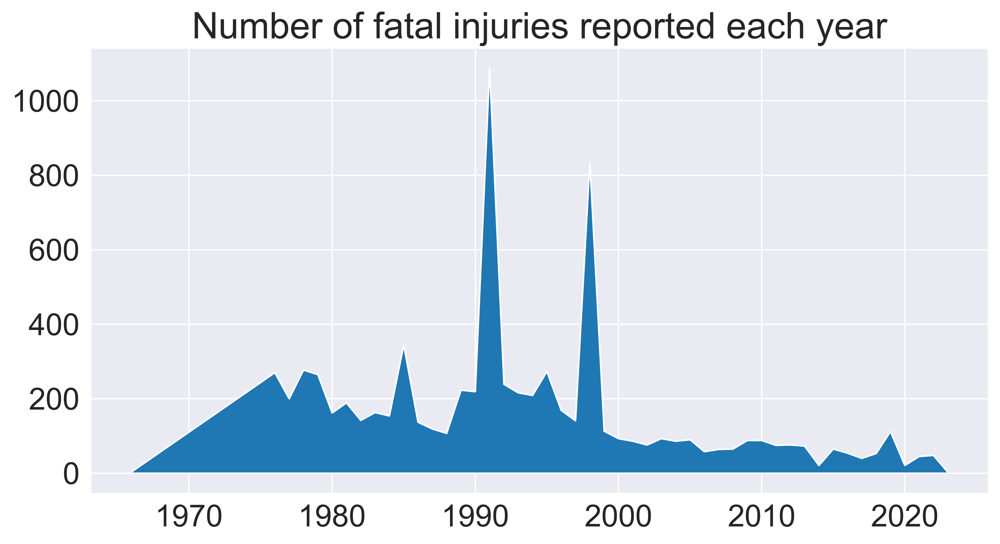

In [58]:
matplotlib.rcParams['figure.figsize'] = (10, 5)
column = 'OccYear'
data = occurence_df[occurence_df[column]>1965].dropna(subset=[column])
data2= data.groupby(column)['TotalFatalCount'].sum()
plt.fill_between(data2.index, data2.values);
plt.ylabel('')
plt.title('Number of fatal injuries reported each year')

## Number of serious injuries reported each year

We perform the same analysis to the serious injuries column. The results are shown in the following plot: 

Text(0.5, 1.0, 'Number of serious injuries reported each year')

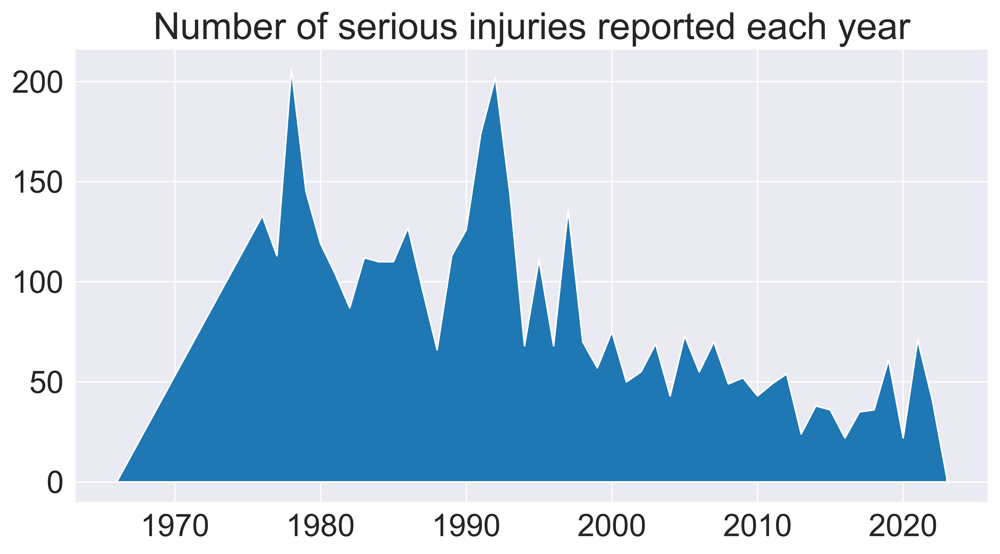

In [59]:
matplotlib.rcParams['figure.figsize'] = (10, 5)
column = 'OccYear'
data = occurence_df[occurence_df[column]>1965].dropna(subset=[column])
data2= data.groupby(column)['TotalSeriousCount'].sum()
plt.fill_between(data2.index, data2.values)
plt.ylabel('')
plt.title('Number of serious injuries reported each year')

## Visualizing the total number of accidents

Finally, we are going to make an analysis of the total number of accidents that occurred in Canada from the year 1965 until now. Representing with a red dot the place it occupies on the map of Canada, within coordinates through which we could know the exact place of the accident.

In [60]:
df = pd.read_csv('occurence.csv', low_memory=False)
df_airports = pd.read_csv('airports-extended.csv', header = None, encoding = 'utf-8')
df_airports.columns = ['AirportID','Name', 'City', 'Country', 'IATA',
                       'ICAO', 'Latitude', 'Longitude', 'Altitude',
                       'Timezone', 'DST', 'Tz', 'Type', 'Source']

In [61]:
df['ICAO']

0         NaN
1        CYYZ
2        CYYT
3        CYVV
4        CYXL
         ... 
50653     NaN
50654     NaN
50655     NaN
50656     NaN
50657     NaN
Name: ICAO, Length: 50658, dtype: object

In [62]:
canada = df_airports[df_airports['Country'] == 'Canada'].copy()

In [63]:
new = pd.merge(canada, df, on = 'ICAO', suffixes = ['_airport', '_accident'])

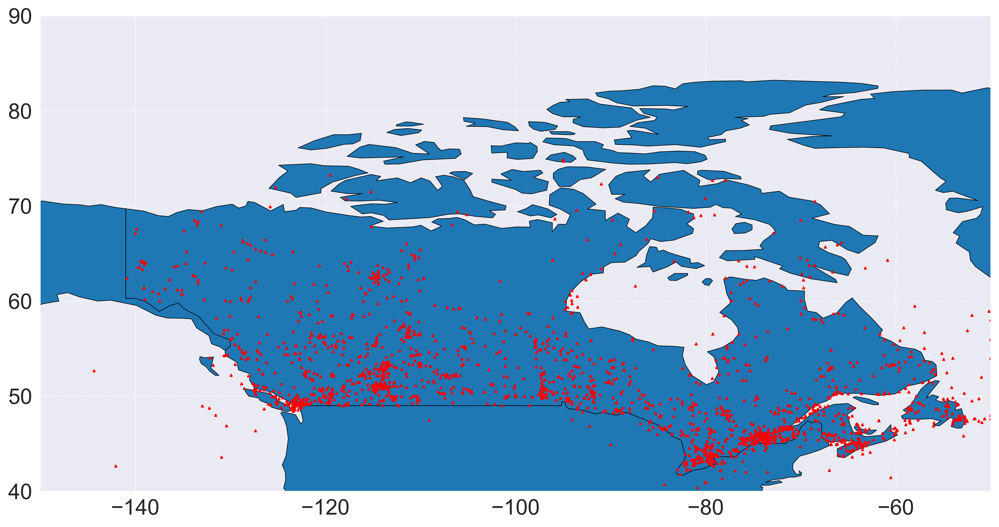

In [64]:
# Load a shapefile of world countries
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Define the latitude and longitude values of some points
latitudes = new['Latitude_accident'] # base de datos de accidentes ['latitud']
longitudes = -new['Longitude_accident']
points = [Point(lon, lat) for lon, lat in zip(longitudes, latitudes)]

# Convert the points to a GeoDataFrame
geo_points = gpd.GeoDataFrame(geometry=points)

# Set up a plot of the world map
fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, edgecolor='k', linewidth = 0.5)

# Plot the points on the map
geo_points.plot(ax=ax, color='red', marker = '^', markersize=3)
plt.grid(which = 'major', linestyle = ':')

# Set the x-axis limits to cover the range of -180 to 180
plt.xlim(-150, -50)

# Set the y-axis limits to cover the range of -90 to 90
plt.ylim(40, 90)

# Show the plot
plt.show()

## Visualization of airplane crashes

We can see that most accidents occur very near to the airport, the cause of this is because that is where planes are taking off or landing, which are the most critical phases of a flight. During these phases, planes are at a lower altitude and closer to the ground, which increases the risk of accidents due to factors such as inclement weather, technical malfunctions, pilot error, or collisions with other aircraft or objects. Additionally, airports are typically located in densely populated areas, which increases the likelihood of damage to property and loss of life in case of an accident. Therefore, it is crucial to ensure that airports have adequate safety measures and procedures to minimize the risk of accidents.

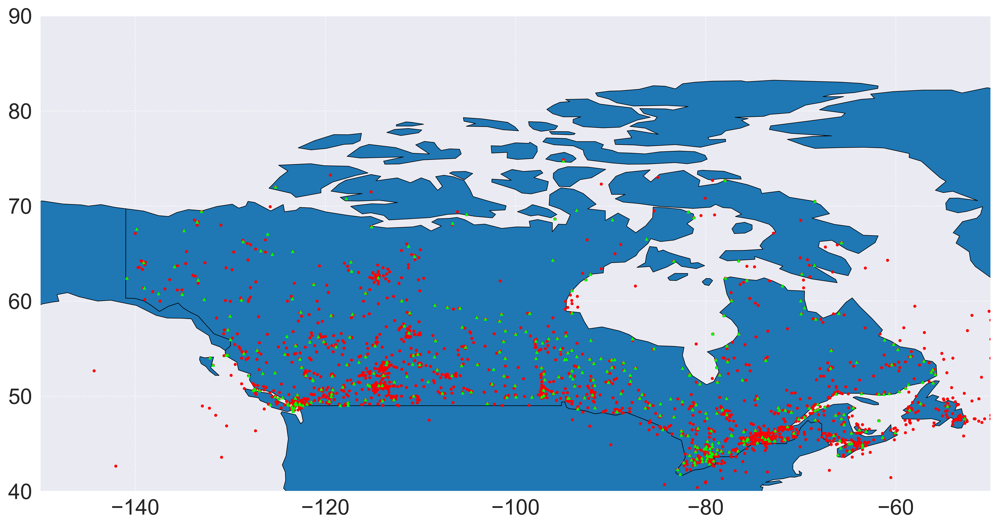

In [65]:
# Load a shapefile of world countries
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Define the latitude and longitude values of some points
latitudes_acc = new['Latitude_accident'] # database of accidents ['Latitude]
longitudes_acc = -new['Longitude_accident'] # database of accidents [Longitude]
points_acc = [Point(lon, lat) for lon, lat in zip(longitudes_acc, latitudes_acc)]

latitudes_air = new['Latitude_airport'] # database of accidents ['Latitude]
longitudes_air = new['Longitude_airport'] # database of accidents [Longitude]
points_air = [Point(lon, lat) for lon, lat in zip(longitudes_air, latitudes_air)]

# Convert the points to a GeoDataFrame

geo_points_acc = gpd.GeoDataFrame(geometry=points_acc)

geo_points_air = gpd.GeoDataFrame(geometry=points_air)
# Set up a plot of the world map


fig, ax = plt.subplots(figsize=(15, 10))


world.plot(ax=ax, edgecolor='k', linewidth = 0.5)

# Plot the points on the map
geo_points_acc.plot(ax=ax, color='red', marker = '8', markersize=3)


geo_points_air.plot(ax=ax, color='lime', marker = '^', markersize=3)



plt.grid(which = 'major', linestyle = ':')

# Set the x-axis limits to cover the range of -180 to 180
plt.xlim(-150, -50)

# Set the y-axis limits to cover the range of -90 to 90
plt.ylim(40, 90)


# Show the plot
plt.show()

Observe the red dots that represent air accidents from the year 1965 until now and the green dots that represent airports.

## Columns descriptions:  

* ***OccTypeID_DisplayEng***  : A description of the occurrence type (accident/incident reportable), in English. <br>
* ***TimeZoneID_DisplayEng***  : The time zone used for reporting the time of occurrence, in English. <br>
* ***LightCondID_DisplayEng***  : A description of the light conditions, in English. <br>
* ***TotalSeriousCount***  : The total number of serious injuries (includes any ground injuries). <br>
* ***InjuriesEnum_DisplayEng***  : Indicates whether there were any injuries related to the occurrence, including ground injuries, in English. <br>
* ***ICAO_DisplayEng***  : The International Civil Aviation Organization (ICAO) occurrence category, in English.
For one occurrence, multiple ICAO categories may be assigned, that will generate multiple entries/rows. <br>
* ***SkyCondID_DisplayEng***  : The sky conditions at the time of the occurrence, in English. <br>
* ***GeneralWeatherID_DisplayEng***  : Indicates whether the known weather conditions were conducive to visual or instrument flight rules, in English. <br>
* ***SurfaceContaminationID_DisplayEng***  : The type of surface contamination, if relevant, in English.
Note: Each description will result in a separate entry. <br>
* ***TotalFatalCount***  : The total number of fatalities (includes any ground fatalities). <br>
* ***OccTime***  : The time the occurrence happened. Time format is hh:mm (24-hour clock). <br>
* ***VisibilyCeiling***  : The visibility ceiling, in feet. <br>
* ***OccNo***  : The unique occurrence number for general reference. <br>
* ***OccRegionID_DisplayEng***  : The region of the occurrence, as defined by the geographical area each regional office has been assigned, in English. <br>
* ***OccDate***  : The occurrence date. Date format is YYYY-MM-DD. <br>
* ***Visibility***  : The visibility, in statute miles. <br>
* ***RunwaySurfaceID_DisplayEng***  : The texture of the surface of the runway involved in the occurrence, in English. <br>
* ***Summary***  : The summary of the occurrence. <br>
* ***WeatherPhenomenaTypeID_DisplayEng***  : The type of weather phenomena at the time of the occurrence, in English.
* ***CountryID_DisplayEng***  : The country of the occurrence, in English. <br>

## Summary  
We presented through this analysis some of the key aspects to consider when it comes to aviation safety. In general, PETE factors are largely used to investigate safety concerns (Person, Equipment, Task, Environment).
Some trends can be observed, such as the decrease in the number of fatal injuries number. On the other hand, the number of incidents is not decreasing. We have shown that some periods are more prone to aviation incidents so more precautions should be taken. 
As well, we could analize the impact of the environmental variables. 
The last part of the analysis was devoted to showing the number of fatal and serious injuries reported each year and we visualize the total number of accidents in Canada since 1965.
 

## Web references
- World airport data https://openflights.org/data.html.
- Transport Canada https://tc.canada.ca/en
- Nav Canada https://www.navcanada.ca/en/
- Statistics Canada https://www.statcan.gc.ca/eng/start
